In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pprint import pprint

import seaborn as sns
import random

import sys
from Bio import Entrez

from scipy.stats import chisquare
import scipy.stats as stats
from scipy.stats import chi2_contingency
from scipy.stats import pearsonr, spearmanr, f_oneway, ttest_ind


#import SeabornFig2Grid as sfg
import matplotlib.gridspec as gridspec

In [2]:
driver_map_data_all_df = pd.read_csv('DriverMapTPM.tsv',delimiter='\t')
driver_map_data_all_df = driver_map_data_all_df.set_index('Unnamed: 0')
# columns: 
#['A10', 'A11', 'A12', 'A2', 'A3', 'A4', 'A5', 'A6', 'A7', 'A8', 'A9', 
# 'B10', 'B11', 'B12', 'B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B9']

# subtract values of negative control from all samples
# not the most pyrhonic way, meh...
driver_map_data_all_df['A2'] = (driver_map_data_all_df['A2']-driver_map_data_all_df['A12'])
driver_map_data_all_df['A3'] = (driver_map_data_all_df['A3']-driver_map_data_all_df['A12'])
driver_map_data_all_df['A4'] = (driver_map_data_all_df['A4']-driver_map_data_all_df['A12'])
driver_map_data_all_df['A5'] = (driver_map_data_all_df['A5']-driver_map_data_all_df['A12'])
driver_map_data_all_df['A6'] = (driver_map_data_all_df['A6']-driver_map_data_all_df['A12'])
driver_map_data_all_df['A7'] = (driver_map_data_all_df['A7']-driver_map_data_all_df['A12'])
driver_map_data_all_df['A8'] = (driver_map_data_all_df['A8']-driver_map_data_all_df['A12'])
driver_map_data_all_df['A9'] = (driver_map_data_all_df['A9']-driver_map_data_all_df['A12'])
driver_map_data_all_df['A10'] = (driver_map_data_all_df['A10']-driver_map_data_all_df['A12'])
driver_map_data_all_df['A12'] = (driver_map_data_all_df['A11']-driver_map_data_all_df['A12'])

driver_map_data_all_df['B2'] = (driver_map_data_all_df['B2']-driver_map_data_all_df['B12'])
driver_map_data_all_df['B3'] = (driver_map_data_all_df['B3']-driver_map_data_all_df['B12'])
driver_map_data_all_df['B4'] = (driver_map_data_all_df['B4']-driver_map_data_all_df['B12'])
driver_map_data_all_df['B5'] = (driver_map_data_all_df['B5']-driver_map_data_all_df['B12'])
driver_map_data_all_df['B6'] = (driver_map_data_all_df['B6']-driver_map_data_all_df['B12'])
driver_map_data_all_df['B7'] = (driver_map_data_all_df['B7']-driver_map_data_all_df['B12'])
driver_map_data_all_df['B8'] = (driver_map_data_all_df['B8']-driver_map_data_all_df['B12'])
driver_map_data_all_df['B9'] = (driver_map_data_all_df['B9']-driver_map_data_all_df['B12'])
driver_map_data_all_df['B10'] = (driver_map_data_all_df['B10']-driver_map_data_all_df['B12'])
driver_map_data_all_df['B12'] = (driver_map_data_all_df['B11']-driver_map_data_all_df['B12'])


driver_map_data_all_df.head()

,A10,A11,A12,A2,A3,A4,A5,A6,A7,A8,...,B11,B12,B2,B3,B4,B5,B6,B7,B8,B9
Unnamed: 0,,,,,,,,,,,,,,,,,,,,,
14266|CENPU,17.60490,23.53280,23.53280,0.294876,43.10860,70.50920,21.41510,1.14305,47.16210,1.43697,...,20.49390,20.49390,0.546198,48.08530,74.59220,26.27370,1.19616,45.71820,2.83643,122.24700
13331|PEX14,19.08750,14.08670,14.08670,27.671900,25.00070,17.33890,25.84810,12.43200,18.08010,10.52050,...,17.62190,17.62190,33.521000,26.23420,24.65790,36.15540,15.84860,18.20870,14.82460,34.43790
6630|RAD52,3.66106,4.29017,4.29017,5.274080,6.98958,3.28098,4.90895,1.53928,5.35737,1.73986,...,6.29135,2.68903,3.567860,7.23578,2.48444,3.01742,-0.13778,4.39435,-1.32502,4.68598
16802|CLYBL,-23.00000,12.58540,-21.88960,-17.580300,-20.19320,-29.54648,-4.10800,-5.53250,-18.95460,-27.22456,...,9.44277,-29.45763,-27.730400,-26.60330,-34.02516,-14.43210,-17.51350,-26.89270,-35.08378,-21.97320
6645|RANBP1,71.64050,79.22280,79.22280,45.997900,218.58800,143.56100,82.09650,30.95460,70.32010,51.50090,...,66.10810,58.72263,28.094730,97.97153,85.66803,39.27063,17.34733,40.00133,34.52083,110.84353


In [3]:

with np.errstate(divide='ignore'):
    driver_map_data_all_log_df = np.log2(driver_map_data_all_df)
# replace negative values with 0    
driver_map_data_all_log_df[driver_map_data_all_log_df < 0 ] = 0
# repleca NaN values  with 0
driver_map_data_all_log_df[driver_map_data_all_log_df.isna() ] = 0

# rename column to sample names + sample_BSA
driver_map_data_all_log_df = driver_map_data_all_log_df[['A2', 'A3', 'A4', 'A5', 'A6', 'A7', 'A8', 'A9', 'A10', 'A11', 'A12', 
                                                'B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B9', 'B10', 'B11', 'B12']]
driver_map_data_all_log_df.columns = ['Brain', 'Univ Stratagene', 'Univ DriverMap','Univ Clontech', 'Univ BioChain', 
                              'Univ Rare', 'WB-Activated','WB-Disease', 'Univ ImmuneT10', 'Hemat System3', 'NegC_B67',
                                 'Brain_BSA', 'Univ Stratagene_BSA', 'Univ DriverMap_BSA','Univ Clontech_BSA', 'Univ BioChain_BSA', 
                              'Univ Rare_BSA', 'WB-Activated_BSA','WB-Disease_BSA', 'Univ ImmuneT10_BSA', 'Hemat System3_BSA', 'NegC_B67_BSA']

driver_map_data_all_log_df.head()

C:\Users\hamst\AppData\Local\Continuum\anaconda3\envs\PythonData\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in log2
  This is separate from the ipykernel package so we can avoid doing imports until


,Brain,Univ Stratagene,Univ DriverMap,Univ Clontech,Univ BioChain,Univ Rare,WB-Activated,WB-Disease,Univ ImmuneT10,Hemat System3,...,Univ Stratagene_BSA,Univ DriverMap_BSA,Univ Clontech_BSA,Univ BioChain_BSA,Univ Rare_BSA,WB-Activated_BSA,WB-Disease_BSA,Univ ImmuneT10_BSA,Hemat System3_BSA,NegC_B67_BSA
Unnamed: 0,,,,,,,,,,,,,,,,,,,,,
14266|CENPU,0.000000,5.429904,6.139740,4.420557,0.192889,5.559556,0.523030,6.599373,4.137905,4.556601,...,5.587524,6.220953,4.715547,0.258410,5.514697,1.504076,6.933655,3.763751,4.357123,4.357123
13331|PEX14,4.790350,4.643897,4.115940,4.691986,3.635987,4.176331,3.395131,4.872642,4.254556,3.816262,...,4.713377,4.623978,5.176139,3.986283,4.186556,3.889921,5.105925,4.458284,4.139298,4.139298
6630|RAD52,2.398919,2.805206,1.714127,2.295414,0.622256,2.421525,0.798971,2.298957,1.872261,2.101035,...,2.855149,1.312921,1.593316,0.000000,2.135650,0.000000,2.228351,1.928363,2.653370,1.427086
16802|CLYBL,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.653679,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.239210,0.000000
6645|RANBP1,5.523496,7.772070,7.165520,6.359249,4.952082,6.135865,5.686526,7.072577,6.162704,6.307844,...,6.614291,6.420685,5.295379,4.116642,5.321976,5.109395,6.792381,5.064388,6.046755,5.875845


In [4]:
# create separate file for DriverMap Original Samples
driver_map_data_df = driver_map_data_all_df.iloc[::,]
driver_map_data_df = driver_map_data_df[['A2', 'A3', 'A4', 'A5', 'A6', 'A7', 'A8', 'A9', 'A10', 'A11', 'A12']]
driver_map_data_df.columns = ['Brain', 'Univ Stratagene', 'Univ DriverMap','Univ Clontech', 'Univ BioChain', 
                              'Univ Rare', 'WB-Activated','WB-Disease', 'Univ ImmuneT10', 'Hemat System3', 'NegC_B67']

driver_map_data_df.reset_index(drop=False)
driver_map_data_df.head()

,Brain,Univ Stratagene,Univ DriverMap,Univ Clontech,Univ BioChain,Univ Rare,WB-Activated,WB-Disease,Univ ImmuneT10,Hemat System3,NegC_B67
Unnamed: 0,,,,,,,,,,,
14266|CENPU,0.294876,43.10860,70.50920,21.41510,1.14305,47.16210,1.43697,96.96370,17.60490,23.53280,23.53280
13331|PEX14,27.671900,25.00070,17.33890,25.84810,12.43200,18.08010,10.52050,29.29620,19.08750,14.08670,14.08670
6630|RAD52,5.274080,6.98958,3.28098,4.90895,1.53928,5.35737,1.73986,4.92102,3.66106,4.29017,4.29017
16802|CLYBL,-17.580300,-20.19320,-29.54648,-4.10800,-5.53250,-18.95460,-27.22456,-16.07510,-23.00000,12.58540,-21.88960
6645|RANBP1,45.997900,218.58800,143.56100,82.09650,30.95460,70.32010,51.50090,134.60400,71.64050,79.22280,79.22280


C:\Users\hamst\AppData\Local\Continuum\anaconda3\envs\PythonData\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in log2
  This is separate from the ipykernel package so we can avoid doing imports until


,Brain,Univ Stratagene,Univ DriverMap,Univ Clontech,Univ BioChain,Univ Rare,WB-Activated,WB-Disease,Univ ImmuneT10,Hemat System3,NegC_B67
count,18989.000000,18989.000000,18989.000000,18989.000000,18989.000000,18989.000000,18989.000000,18989.000000,18989.000000,18989.000000,18989.000000
mean,2.450877,2.341570,2.277876,2.601848,1.718796,2.514292,1.844932,2.172167,2.332660,2.953104,2.099377
std,2.757712,2.735929,2.746211,2.677327,2.409164,2.653809,2.625718,2.765882,2.622364,2.558000,2.590547
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.124169,0.000000
50%,1.328888,0.916515,0.462576,2.141665,0.000000,1.984177,0.000000,0.000000,1.467566,2.803502,0.593249
75%,4.716415,4.531874,4.434255,4.736572,3.255569,4.619935,3.617381,4.376686,4.308055,4.807824,3.984972
max,15.099557,13.193981,12.993463,13.537405,15.564708,13.854684,14.635486,13.602317,14.502770,14.745118,14.736447


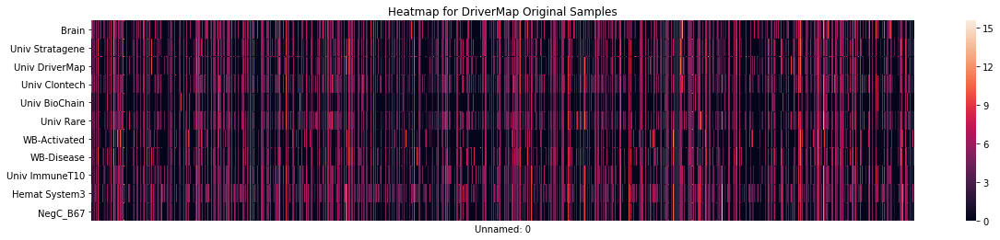

In [5]:
# take log2 of the original and ignote devide by 0 error message
with np.errstate(divide='ignore'):
    driver_map_data_log_df = np.log2(driver_map_data_df)

# replace negative values with 0    
driver_map_data_log_df[driver_map_data_log_df < 0 ] = 0
# repleca NaN values  with 0
driver_map_data_log_df[driver_map_data_log_df.isna() ] = 0

#flip axis
switch_driver_map_data_log_df=driver_map_data_log_df.transpose()

# create heap map
plt.figure(figsize=(20,4))
sns.heatmap(switch_driver_map_data_log_df,xticklabels=False,yticklabels=True)
plt.title('Heatmap for DriverMap Original Samples')

switch_driver_map_data_log_df.to_csv('DM_data_log_original.csv')
driver_map_data_log_df.describe()

,Brain,Univ Stratagene,Univ DriverMap,Univ Clontech,Univ BioChain,Univ Rare,WB-Activated,WB-Disease,Univ ImmuneT10,Hemat System3,NegC_B67
count,18989.000000,18989.000000,18989.000000,18989.000000,18989.000000,18989.000000,18989.000000,18989.000000,18989.000000,18989.000000,18989.000000
mean,2.333438,2.365323,2.287656,2.576819,1.680702,2.466919,1.794205,2.189244,2.326057,3.087275,2.149791
std,2.732538,2.768558,2.776789,2.710640,2.408567,2.673944,2.614511,2.785213,2.647871,2.563306,2.627872
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.332473,0.000000
50%,0.835730,0.791614,0.161062,2.015426,0.000000,1.773342,0.000000,0.000000,1.304704,3.036254,0.487692
75%,4.569983,4.641893,4.553981,4.773020,3.198973,4.619924,3.523926,4.457430,4.377839,4.967634,4.151526
max,16.015493,12.968098,12.960174,14.101352,15.632455,14.480078,14.581995,13.203096,15.196160,14.764224,14.757696


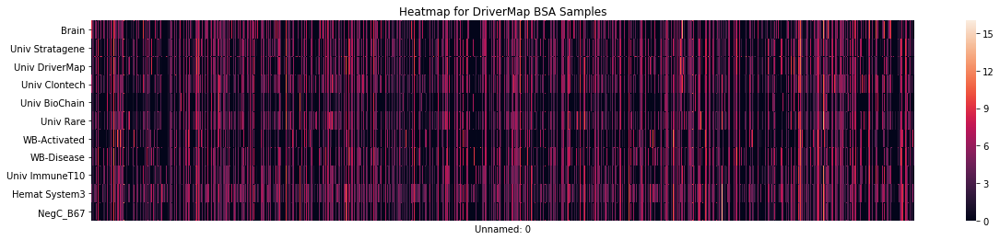

In [6]:
# Make DF for DriverMap for samples treated with BSA and 
driver_map_data_bsa_df = driver_map_data_all_df.iloc[::,-12:]
driver_map_data_bsa_df = driver_map_data_bsa_df[['B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B9', 'B10', 'B11', 'B12']]
driver_map_data_bsa_df.columns = ['Brain', 'Univ Stratagene', 'Univ DriverMap','Univ Clontech', 'Univ BioChain', 
                              'Univ Rare', 'WB-Activated','WB-Disease', 'Univ ImmuneT10', 'Hemat System3', 'NegC_B67']

#driver_map_data_bsa_df.reset_index(drop=False)

# convert DriverMap data into log2 functions and ignote devide by 0 error message
with np.errstate(divide='ignore'):
    driver_map_data_bsa_log_df = driver_map_data_bsa_df.apply(np.log2, reduce=None)

# replace negative values with 0    
driver_map_data_bsa_log_df[driver_map_data_bsa_log_df < 0 ] = 0
# replace NaN values with 0  
driver_map_data_bsa_log_df[driver_map_data_bsa_log_df.isna() ] = 0

    
#flip axis
switch_driver_map_data_bsa_log_df=driver_map_data_bsa_log_df.transpose()


plt.figure(figsize=(20,4))
sns.heatmap(switch_driver_map_data_bsa_log_df,xticklabels=False,yticklabels=True)
plt.title('Heatmap for DriverMap BSA Samples')

switch_driver_map_data_bsa_log_df.to_csv('DM_data_log_BSA.csv')
driver_map_data_bsa_log_df.describe()

In [7]:
unique_genes_split = driver_map_data_df.index.str.split('|')
gene_name_list = [unique_genes_split[i][1] for i in range(len(unique_genes_split))]


In [8]:
bins = [-1,0,4,7,17]
bin_labels = ['no read','low','medium','high']

def bin_logs(df):
    
    # Make empty dictionary to fill with column cut in bins
    bin_data = {}
    # Make empty dictionary to fill with count of genes per bin
    bin_group = {}
    
    for i in list(df.columns):
        bin_data[i] = pd.cut(df[i],bins,labels=bin_labels)
    
    # Make temporary df with binned data
    bin_dataf = pd.DataFrame.from_dict(bin_data)
    
    # Make df with counts of gene grouped by bin
    for j in list(bin_dataf.columns):
        gr_count = bin_dataf.groupby(j)[j].count()
        bin_group[j] = gr_count
    
    return pd.DataFrame.from_dict(bin_group)

In [9]:
# rearrange samples original and BSA next to yeach other on big graph
driver_map_data_all_log_df = driver_map_data_all_log_df[['Brain', 'Brain_BSA',
                                         'Univ Stratagene', 'Univ Stratagene_BSA',
                                         'Univ DriverMap','Univ DriverMap_BSA',
                                         'Univ Clontech', 'Univ Clontech_BSA',
                                         'Univ BioChain', 'Univ BioChain_BSA',
                                         'Univ Rare', 'Univ Rare_BSA',
                                         'WB-Activated', 'WB-Activated_BSA',
                                         'WB-Disease', 'WB-Disease_BSA',
                                         'Univ ImmuneT10', 'Univ ImmuneT10_BSA',
                                         'Hemat System3', 'Hemat System3_BSA',
                                         'NegC_B67','NegC_B67_BSA']]

binned_all_dm_data = bin_logs(driver_map_data_all_log_df)
binned_all_dm_data

,Brain,Brain_BSA,Univ Stratagene,Univ Stratagene_BSA,Univ DriverMap,Univ DriverMap_BSA,Univ Clontech,Univ Clontech_BSA,Univ BioChain,Univ BioChain_BSA,...,WB-Activated,WB-Activated_BSA,WB-Disease,WB-Disease_BSA,Univ ImmuneT10,Univ ImmuneT10_BSA,Hemat System3,Hemat System3_BSA,NegC_B67,NegC_B67_BSA
no read,8559,9002,8807,8982,9220,9405,7415,7794,10181,10525,...,10672,10968,9885,9966,8179,8483,4606,4379,9013,9151
low,4416,4272,4500,4149,4293,3974,5334,4918,5150,4858,...,4061,3876,3763,3620,5484,5053,7768,7474,5256,4827
medium,4658,4442,4405,4528,4167,4257,5002,4996,2941,2916,...,3175,3099,4044,4036,4257,4356,5345,5801,3737,3983
high,1356,1273,1277,1330,1309,1353,1238,1281,717,690,...,1081,1046,1297,1367,1069,1097,1270,1335,983,1028


In [10]:
binned_dm_data = bin_logs(driver_map_data_log_df)
binned_dm_data

,Brain,Univ Stratagene,Univ DriverMap,Univ Clontech,Univ BioChain,Univ Rare,WB-Activated,WB-Disease,Univ ImmuneT10,Hemat System3,NegC_B67
no read,8559,8807,9220,7415,10181,7678,10672,9885,8179,4606,9013
low,4416,4500,4293,5334,5150,5311,4061,3763,5484,7768,5256
medium,4658,4405,4167,5002,2941,4851,3175,4044,4257,5345,3737
high,1356,1277,1309,1238,717,1149,1081,1297,1069,1270,983


In [11]:
binned_bsa_data = bin_logs(driver_map_data_bsa_log_df)
binned_bsa_data

,Brain,Univ Stratagene,Univ DriverMap,Univ Clontech,Univ BioChain,Univ Rare,WB-Activated,WB-Disease,Univ ImmuneT10,Hemat System3,NegC_B67
no read,9002,8982,9405,7794,10525,8060,10968,9966,8483,4379,9151
low,4272,4149,3974,4918,4858,4988,3876,3620,5053,7474,4827
medium,4442,4528,4257,4996,2916,4801,3099,4036,4356,5801,3983
high,1273,1330,1353,1281,690,1140,1046,1367,1097,1335,1028


In [12]:
def bin_logs_df(df):
    
    # Make empty dictionary to fill with column cut in bins
    bin_data = {}
    # Make empty dictionary to fill with count of genes per bin
    bin_group = {}
    
    for i in list(df.columns):
        bin_data[i] = pd.cut(df[i],bins,labels=bin_labels)
    
    # Make temporary df with binned data
    bin_dataf = pd.DataFrame.from_dict(bin_data)
    
    # Make df with counts of gene grouped by bin
#    for j in list(bin_dataf.columns):
#        gr_count = bin_dataf.groupby(j)[j].count()
#        bin_group[j] = gr_count
    
    return bin_dataf

bin_df = bin_logs_df(driver_map_data_all_log_df)

bin_df.head()
bin_df.index

Index(['14266|CENPU', '13331|PEX14', '6630|RAD52', '16802|CLYBL',
       '6645|RANBP1', '12149|KDF1', '11733|TBC1D30', '14535|TMEM258',
       '12400|LRG1', '11931|HYAL1',
       ...
       '16176|GAB3', '13299|ZNF701', '5706|NEB', '15110|ZNF775', '3181|CCNB2',
       '16735|BBS12', '14784|ANKRD27', '3464|COL19A1', '10238|TCTA',
       '10545|CA5A'],
      dtype='object', name='Unnamed: 0', length=18989)

In [13]:
brain_index_high = bin_df.loc[bin_df['Brain'] == 'high'].index.to_list()
b_i_h = []
brain_index_high  = [b_i_h.append(i) for i in brain_index_high]
#brain_index_high = str(brain_index_high).split('|')

#confirm that all gene names are unique
#brain_index_high = [brain_index_high[i][1] for i in range(len(brain_index_high))]

b_i_h

['4339|GAD1',
 '14256|SRGN',
 '12158|KIAA1107',
 '3108|CAMKK2',
 '700|CD74',
 '2747|ARHGAP5',
 '11527|AAK1',
 '8000|WLS',
 '9122|ADARB1',
 '11988|APPL1',
 '72|CAPN7',
 '184|FMR1',
 '11304|TBR1',
 '11966|CLIP3',
 '1179|MPPED1',
 '13532|PCNP',
 '11164|STUB1',
 '3826|DNAJC15',
 '13628|LRRC47',
 '11109|ACTR1B',
 '12065|AK5',
 '869|FEZ1',
 '20273|UBE2H',
 '6344|POLR2D',
 '13437|BEX4',
 '445|STAT3',
 '7922|VDAC1',
 '10608|CBX1',
 '7790|TUBB2B',
 '5682|NDUFA10',
 '2980|BTBD3',
 '7016|SGPP2',
 '3919|EDIL3',
 '8038|XRCC5',
 '9787|NDUFA5',
 '11606|NMNAT2',
 '6048|PCDH7',
 '126|CUL1',
 '6959|SERP1',
 '10517|C6orf106',
 '5422|MGST1',
 '7459|TAF10',
 '4022|EPS15',
 '9714|MAP4',
 '9258|CIRBP',
 '953|ICA1',
 '1949|SDC4',
 '6730|RGS11',
 '9019|TPM1',
 '20099|FUT9',
 '10852|SLC4A7',
 '11958|NECAP1',
 '12510|MRPL51',
 '2737|ARF1',
 '13845|RPL28',
 '10870|EI24',
 '7606|TMED2',
 '15440|CADPS2',
 '6750|RIMS1',
 '9627|ITPR1',
 '19745|TCEB1',
 '11052|DAP3',
 '3315|CFLAR',
 '5726|NFE2L1',
 '12391|LPCAT4',
 '7

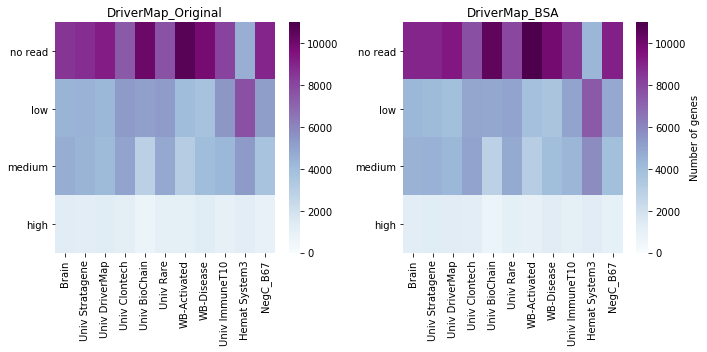

In [14]:
fig = plt.figure(figsize = (10,5)) 
ax1 = fig.add_subplot(1, 2, 1) 
ax2 = fig.add_subplot(1, 2, 2)

sns.heatmap(binned_dm_data, cmap = 'BuPu', ax = ax1, vmin=0, vmax=11000) 
plt.setp(ax1.yaxis.get_majorticklabels(), rotation = 0)
ax1.set_title('DriverMap_Original')

sns.heatmap(binned_bsa_data, cmap = 'BuPu', ax = ax2, vmin=0, vmax=11000, cbar_kws = {'label':'Number of genes'})
plt.setp(ax2.yaxis.get_majorticklabels(), rotation = 0)
ax2.set_title('DriverMap_BSA')

plt.tight_layout()

Text(0.5, 1.0, 'DriverMap_Original_and_BSA')

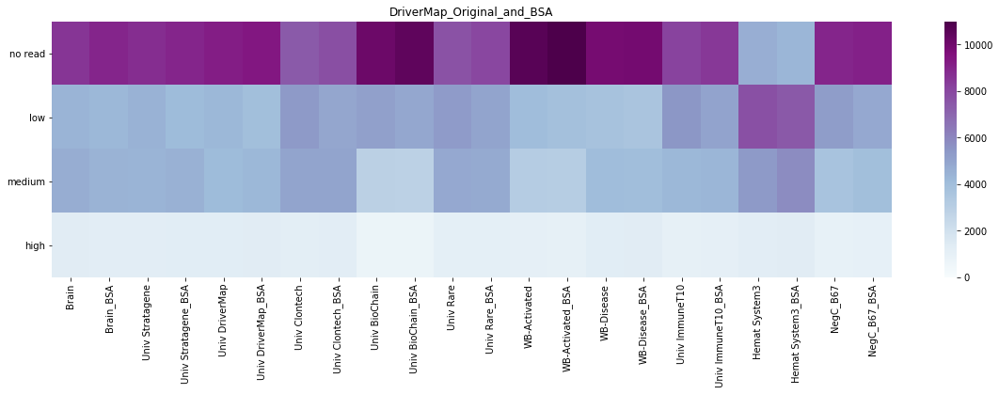

In [15]:

fig = plt.figure(figsize = (20,5)) 
ax1 = fig.add_subplot(1, 1, 1) 

sns.heatmap(binned_all_dm_data, cmap = 'BuPu', ax = ax1, vmin=0, vmax=11000) 
plt.setp(ax1.yaxis.get_majorticklabels(), rotation = 0)
ax1.set_title('DriverMap_Original_and_BSA')

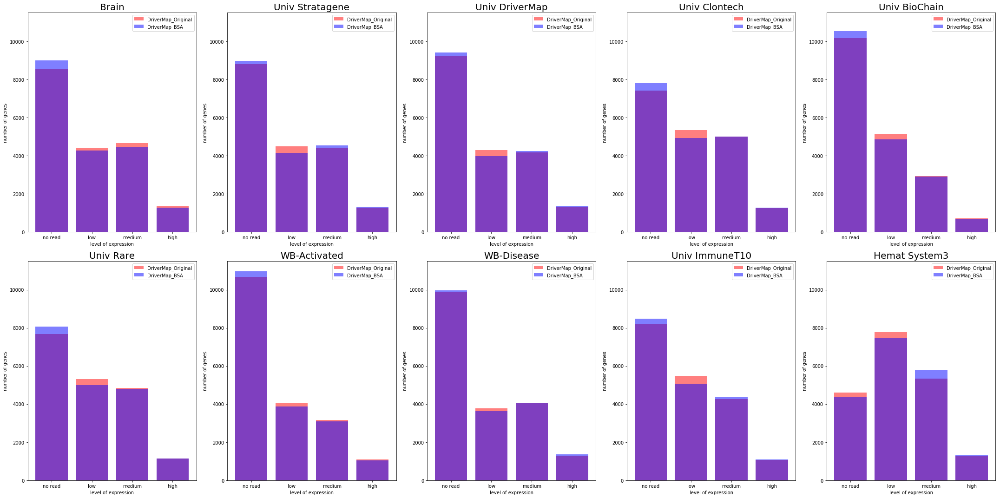

In [16]:
plt.figure(figsize=(30,15))

for i in range(10):
    title_font = {'size':'20'}
    plt.subplot(2,5,i+1)
    plt.bar(x = binned_dm_data.index, height = binned_dm_data.iloc[:,i], alpha=0.5, color='red',label='DriverMap_Original')
    plt.bar(x = binned_bsa_data.index, height = binned_bsa_data.iloc[:,i], alpha=0.5, color='blue',label='DriverMap_BSA')
    plt.title(binned_dm_data.columns[i],**title_font)
    plt.xlabel('level of expression')
    plt.ylabel('number of genes')
    plt.ylim(0, 11500)
    plt.legend()
    
plt.tight_layout()

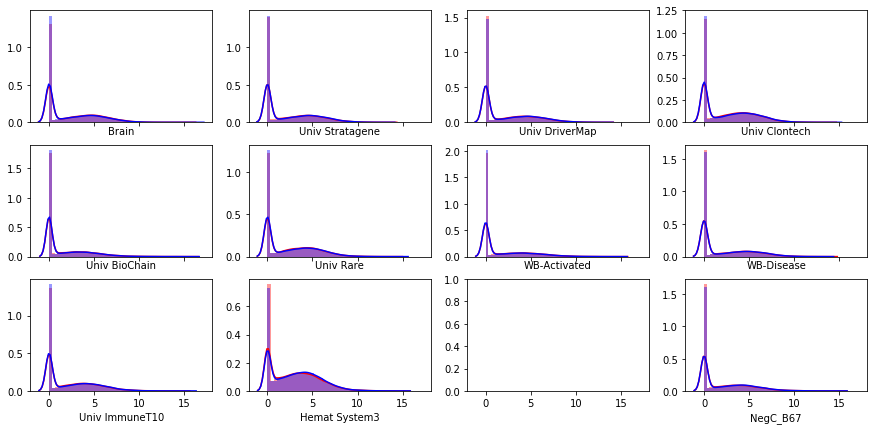

In [17]:
f, axes = plt.subplots(3, 4, figsize=(15, 7), sharex=True)

ax = sns.distplot( driver_map_data_log_df['Brain'] , color="red", ax=axes[0, 0])
ax = sns.distplot( driver_map_data_bsa_log_df['Brain'] , color="blue", ax=axes[0, 0])
ax = sns.distplot( driver_map_data_log_df['Univ Stratagene'] , color="red", ax=axes[0, 1])
ax = sns.distplot( driver_map_data_bsa_log_df['Univ Stratagene'] , color="blue", ax=axes[0, 1])
ax = sns.distplot( driver_map_data_log_df['Univ DriverMap'] , color="red", ax=axes[0, 2])
ax = sns.distplot( driver_map_data_bsa_log_df['Univ DriverMap'] , color="blue", ax=axes[0, 2])
ax = sns.distplot( driver_map_data_log_df['Univ Clontech'] , color="red", ax=axes[0, 3])
ax = sns.distplot( driver_map_data_bsa_log_df['Univ Clontech'] , color="blue", ax=axes[0, 3])
ax = sns.distplot( driver_map_data_log_df['Univ BioChain'] , color="red", ax=axes[1, 0])
ax = sns.distplot( driver_map_data_bsa_log_df['Univ BioChain'] , color="blue", ax=axes[1, 0])
ax = sns.distplot( driver_map_data_log_df['Univ Rare'] , color="red", ax=axes[1, 1])
ax = sns.distplot( driver_map_data_bsa_log_df['Univ Rare'] , color="blue", ax=axes[1, 1])
ax = sns.distplot( driver_map_data_log_df['WB-Activated'] , color="red", ax=axes[1, 2])
ax = sns.distplot( driver_map_data_bsa_log_df['WB-Activated'] , color="blue", ax=axes[1, 2])
ax = sns.distplot( driver_map_data_log_df['WB-Disease'] , color="red", ax=axes[1, 3])
ax = sns.distplot( driver_map_data_bsa_log_df['WB-Disease'] , color="blue", ax=axes[1, 3])
ax = sns.distplot( driver_map_data_log_df['Univ ImmuneT10'] , color="red", ax=axes[2, 0])
ax = sns.distplot( driver_map_data_bsa_log_df['Univ ImmuneT10'] , color="blue", ax=axes[2, 0])
ax = sns.distplot( driver_map_data_log_df['Hemat System3'] , color="red", ax=axes[2, 1])
ax = sns.distplot( driver_map_data_bsa_log_df['Hemat System3'] , color="blue", ax=axes[2, 1])
ax = sns.distplot( driver_map_data_log_df['NegC_B67'] , color="red", ax=axes[2, 3])
ax = sns.distplot( driver_map_data_bsa_log_df['NegC_B67'] , color="blue", ax=axes[2, 3])


In [18]:
# another possible way to normalize data

#log2df = np.log2(my_df)
#log2mean = log2df.mean(axis='columns')
#log_div_ave = log2df.subtract(log2mean, axis='index')



In [19]:
# Function to calculate correlation coefficient between two arrays
def corr(x, y, **kwargs):
    
    # Calculate the value
    coef = np.corrcoef(x, y)[0][1]
    # Make the label
    label = r'$\rho$ = ' + str(round(coef, 2))
    
    # Add the label to the plot
    ax = plt.gca()
    ax.annotate(label, xy = (0.2, 0.95), size = 20, xycoords = ax.transAxes)

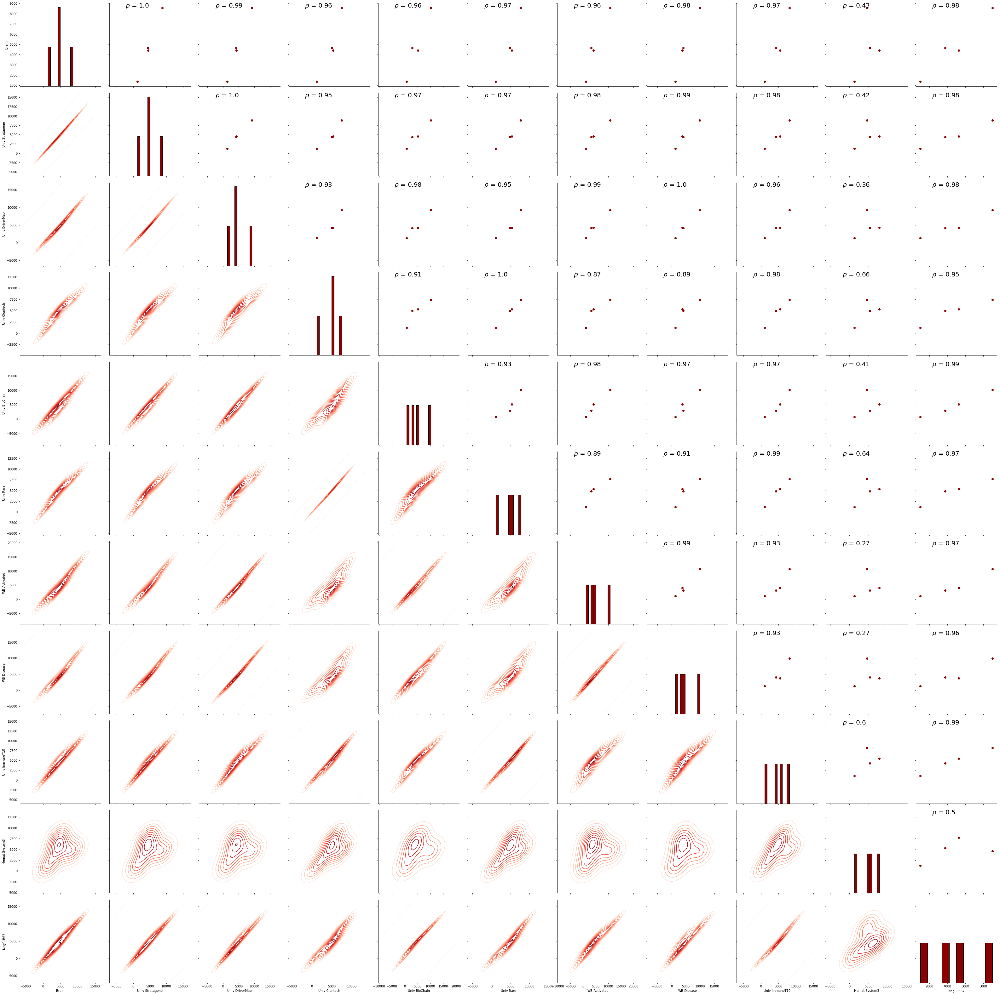

In [20]:
# Create a pair grid instance
grid = sns.PairGrid(data= binned_dm_data, height = 4)

# Map the plots to the locations
grid = grid.map_upper(plt.scatter, color = 'darkred')
grid = grid.map_upper(corr)
grid = grid.map_lower(sns.kdeplot, cmap = 'Reds')
grid = grid.map_diag(plt.hist, bins = 10, edgecolor =  'k', color = 'darkred');

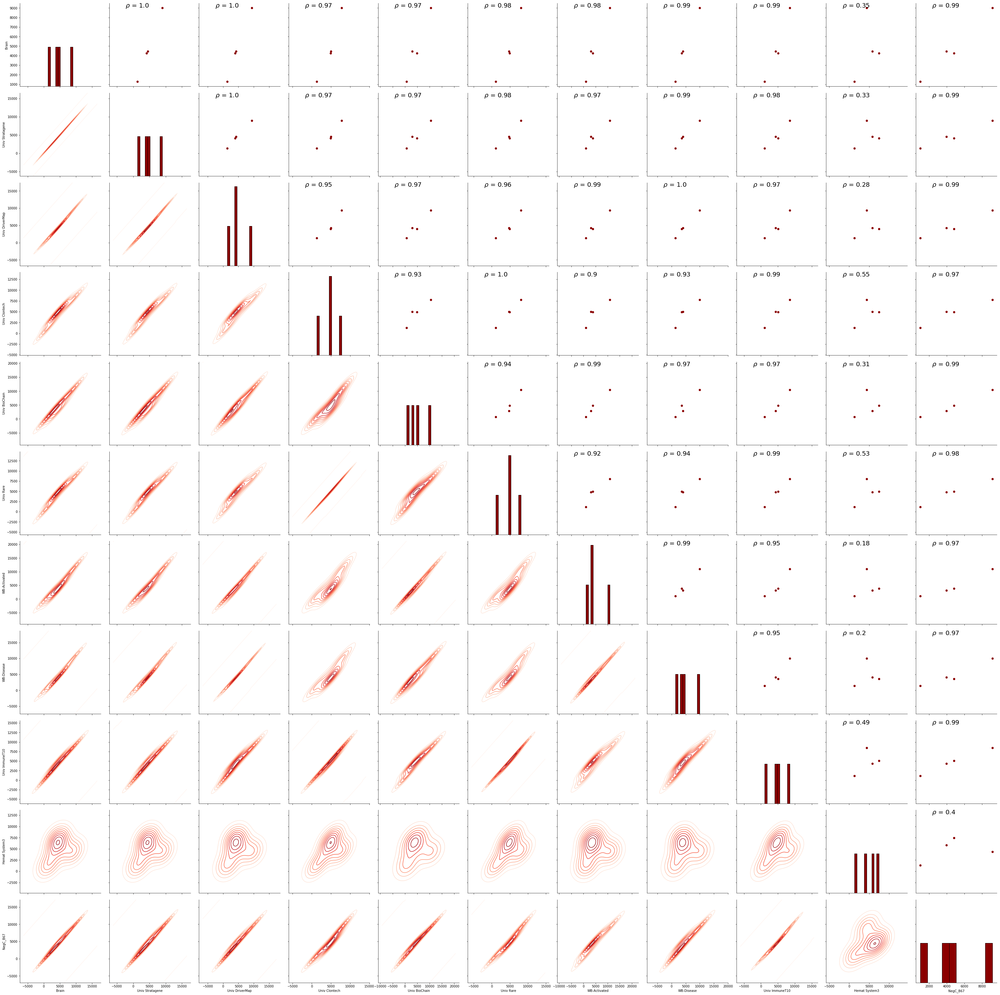

In [21]:
# Create a pair grid instance
grid = sns.PairGrid(data= binned_bsa_data, height = 4)

# Map the plots to the locations
grid = grid.map_upper(plt.scatter, color = 'darkred')
grid = grid.map_upper(corr)
grid = grid.map_lower(sns.kdeplot, cmap = 'Reds')
grid = grid.map_diag(plt.hist, bins = 10, edgecolor =  'k', color = 'darkred');

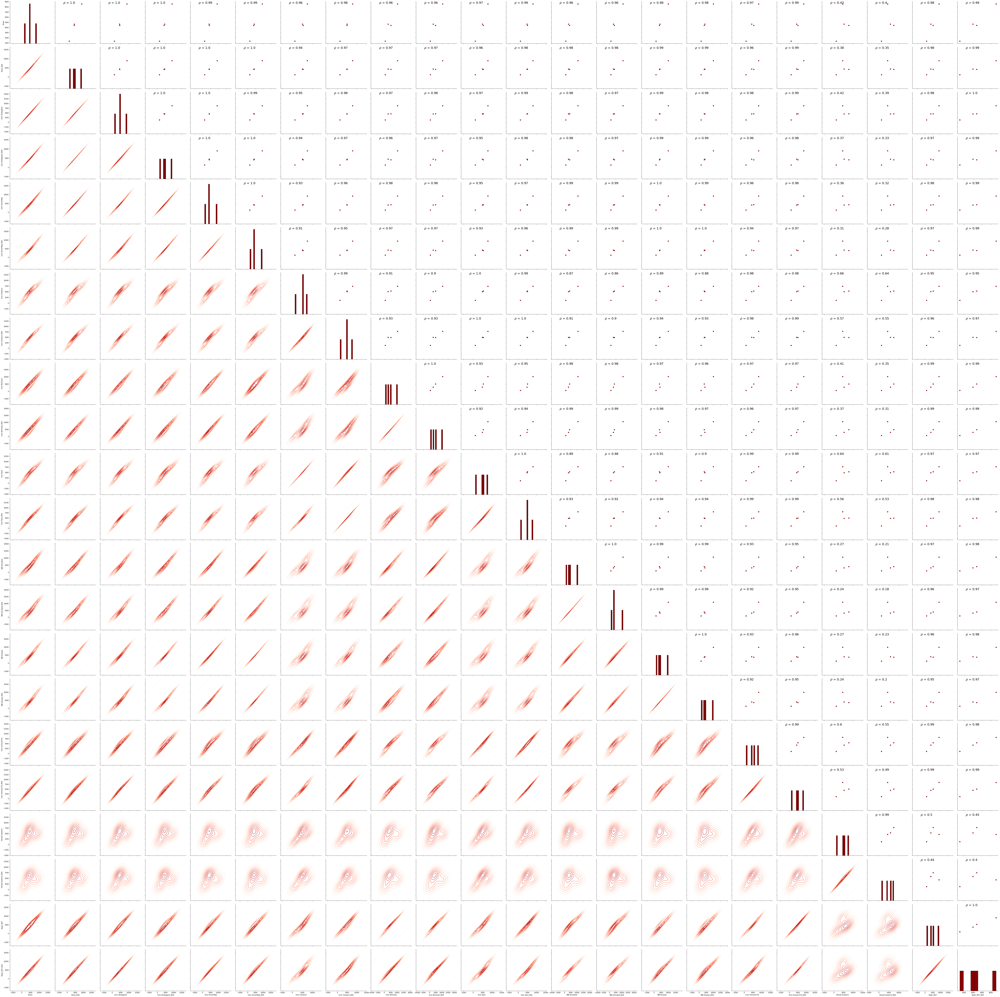

In [22]:
# Create a pair grid instance
grid = sns.PairGrid(data= binned_all_dm_data, height = 4)

# Map the plots to the locations
grid = grid.map_upper(plt.scatter, color = 'darkred')
grid = grid.map_upper(corr)
grid = grid.map_lower(sns.kdeplot, cmap = 'Reds')
grid = grid.map_diag(plt.hist, bins = 10, edgecolor =  'k', color = 'darkred');

<Figure size 936x576 with 0 Axes>

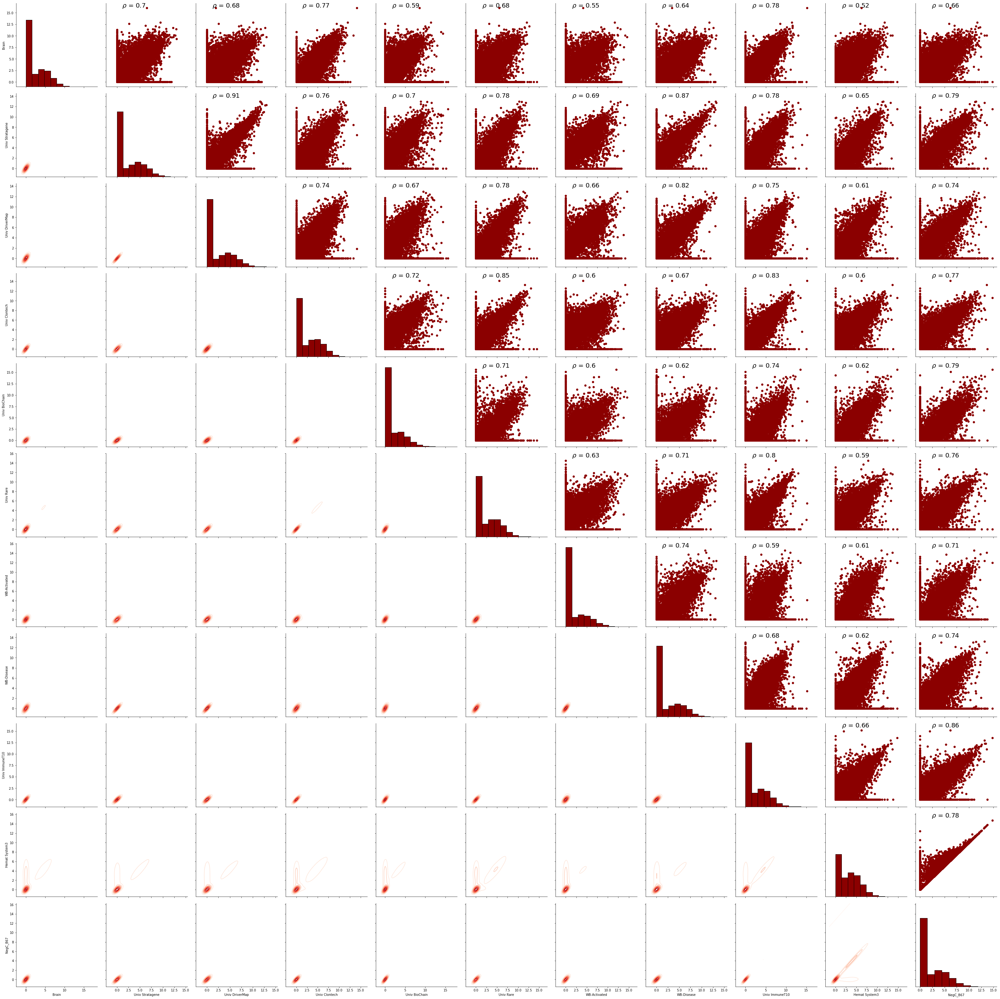

In [25]:
# Create a pair grid instance
fig = plt.figure(figsize=(13,8))
grid = sns.PairGrid(data= driver_map_data_bsa_log_df, height = 4)

# Map the plots to the locations
grid = grid.map_upper(plt.scatter, color = 'darkred')
grid = grid.map_upper(corr)
grid = grid.map_lower(sns.kdeplot, cmap = 'Reds')
grid = grid.map_diag(plt.hist, bins = 10, edgecolor = 'k', color = 'darkred');

(array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22]), <a list of 22 Text xticklabel objects>)

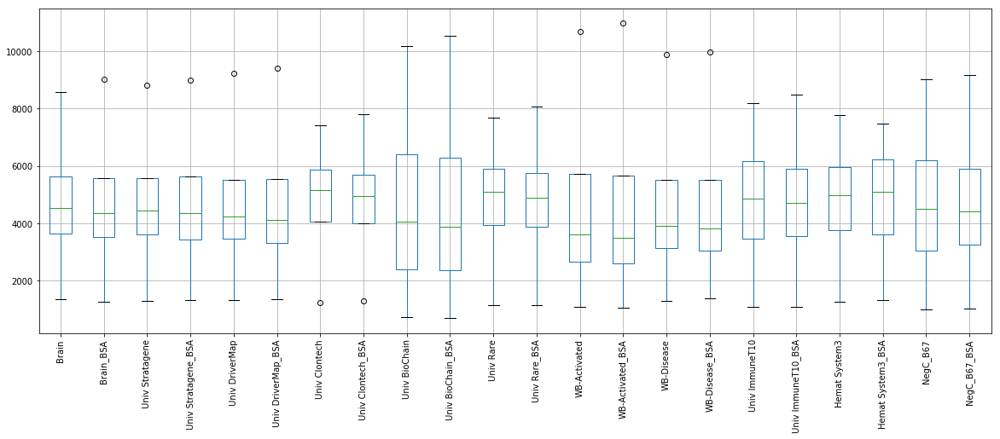

In [26]:
# Box plots to visualize outliers for binned data

plt.figure(figsize=(20,7))
plt.subplots
binned_all_dm_data.boxplot()
plt.xticks(rotation=90)

(array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22]), <a list of 22 Text xticklabel objects>)

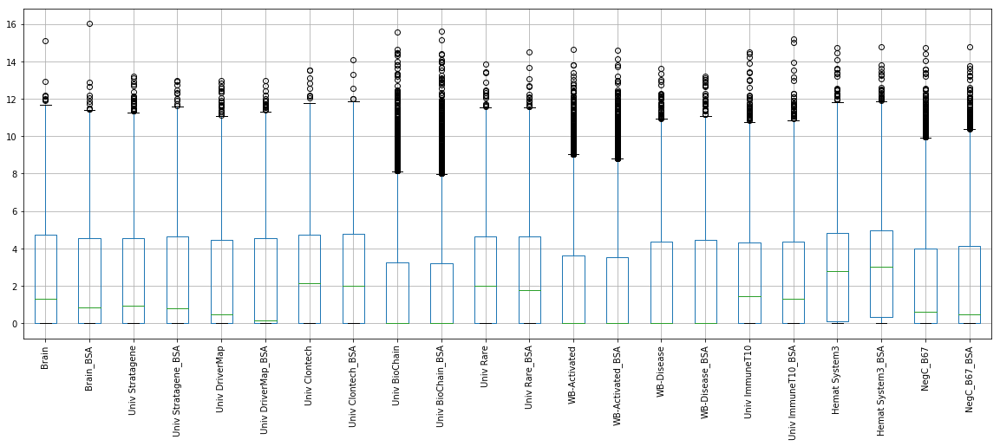

In [27]:
# Box plots to visualize outliers for log data
# a lot more outliers
plt.figure(figsize=(20,7))
plt.subplots
driver_map_data_all_log_df.boxplot()
plt.xticks(rotation=90)

An Independent Samples t-test compares the means for two groups.


The hypothesis being tested is:

Null hypothesis (H0): u1 = u2, which translates to the mean of sample 1 is equal to the mean of sample 2
Alternative hypothesis (HA): u1 ? u2, which translates to the mean of sample 1 is not equal to the mean of sample 2

A p-value is the probability of rejecting a null-hypothesis when the hypothesis is proven true. The null hypothesis is a statement that says that there is no difference between two measures.

We are interested in p-values below 0.05(significant).

In [28]:
# t-test for binned data
idx = binned_dm_data.index.intersection(binned_bsa_data.index)
t_test_bins_df = pd.DataFrame(ttest_ind(binned_dm_data.loc[idx], binned_bsa_data.loc[idx], axis=1), 
                              index=['t-stat','p-value'], columns = bin_labels)

#Ttest_indResult(
#    statistic=array([-0.31240597,  0.66835531, -0.17359046, -0.21035294]), 
#    pvalue=array([0.75796591, 0.51154742, 0.86393227, 0.83552046]))
flip_t_test_bins_df = t_test_bins_df.transpose()

flip_t_test_bins_df.describe()
t_test_bins_df
# no real statistical difference

,no read,low,medium,high
t-stat,-0.312406,0.668355,-0.173590,-0.210353
p-value,0.757966,0.511547,0.863932,0.835520


In [29]:
#t-test for log data
index = ['Original', 'BSA']

idx = driver_map_data_log_df.index.intersection(driver_map_data_bsa_log_df.index)
t_test_df = pd.DataFrame(ttest_ind(driver_map_data_log_df.loc[idx], driver_map_data_bsa_log_df.loc[idx], axis=1), 
                         index=['t-stat','p-value'], columns=gene_name_list)
flip_t_test_df = t_test_df.transpose()

flip_t_test_df = [flip_t_test_df[['p-value']] < 0.05]
#flip_t_test_df.count('False')
flip_t_test_df = flip_t_test_df[0]
#f = flip_t_test_df.drop([flip_t_test_df['p-value'] == False])

np.sum(flip_t_test_df['p-value']) # 2829 genes have statistical significance.
#flip_t_test_df.describe()

C:\Users\hamst\AppData\Local\Continuum\anaconda3\envs\PythonData\lib\site-packages\scipy\stats\_distn_infrastructure.py:877: RuntimeWarning: invalid value encountered in greater
  return (self.a < x) & (x < self.b)
C:\Users\hamst\AppData\Local\Continuum\anaconda3\envs\PythonData\lib\site-packages\scipy\stats\_distn_infrastructure.py:877: RuntimeWarning: invalid value encountered in less
  return (self.a < x) & (x < self.b)
C:\Users\hamst\AppData\Local\Continuum\anaconda3\envs\PythonData\lib\site-packages\scipy\stats\_distn_infrastructure.py:1831: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= self.a)


2829

In [30]:
#t-test for TPM data
index = ['Original', 'BSA']

idx = driver_map_data_all_df.index.intersection(driver_map_data_all_df.index)
t_test_df = pd.DataFrame(ttest_ind(driver_map_data_all_df.loc[idx], driver_map_data_all_df.loc[idx], axis=1), 
                         index=['t-stat','p-value'], columns=gene_name_list)
flip_t_test_df = t_test_df.transpose()

flip_t_test_df = [flip_t_test_df[['p-value']] < 0.05]
#flip_t_test_df.count('False')
flip_t_test_df = flip_t_test_df[0]
#f = flip_t_test_df.drop([flip_t_test_df['p-value'] == False])

np.sum(flip_t_test_df['p-value']) # 2829 genes have statistical significance.
#flip_t_test_df.describe()

0

In [31]:
# create a new DataFrame where the values for the indices and columns align on the diagonals
# Pearson correlation between two samples

# A value greater than 0 indicates a positive association; that is, as the value of one variable increases, 
# so does the value of the other variable.

pearson_corr = pd.DataFrame(columns = driver_map_data_log_df.columns, index = driver_map_data_log_df.columns)

for col in pearson_corr.columns:
    for idx in pearson_corr.index:
        correl_signif = pearsonr(driver_map_data_log_df[col], driver_map_data_bsa_log_df[idx])
        correl = correl_signif[0]
        pearson_corr.loc[idx, col] = correl

pearson_corr.head()

,Brain,Univ Stratagene,Univ DriverMap,Univ Clontech,Univ BioChain,Univ Rare,WB-Activated,WB-Disease,Univ ImmuneT10,Hemat System3,NegC_B67
Brain,0.872801,0.613335,0.600848,0.67887,0.525643,0.58926,0.497301,0.570117,0.672363,0.499767,0.566944
Univ Stratagene,0.631267,0.877215,0.812207,0.684056,0.643515,0.693859,0.636052,0.793246,0.684156,0.63154,0.694028
Univ DriverMap,0.614173,0.812441,0.886387,0.670755,0.616885,0.699526,0.610952,0.7525,0.659586,0.592194,0.648815
Univ Clontech,0.680773,0.662689,0.65277,0.844619,0.640806,0.731926,0.541321,0.597092,0.707919,0.565736,0.657185
Univ BioChain,0.528591,0.639403,0.612961,0.649979,0.8854,0.636214,0.541346,0.563395,0.662934,0.607251,0.700219


In [32]:

spearman_corr = pd.DataFrame(columns = driver_map_data_log_df.columns, index = driver_map_data_log_df.columns)

for col in spearman_corr.columns:
    for idx in spearman_corr.index:
        correl_signif = spearmanr(driver_map_data_log_df[col], driver_map_data_bsa_log_df[idx])
        correl = correl_signif[0]
        spearman_corr.loc[idx, col] = correl

spearman_corr.head()

,Brain,Univ Stratagene,Univ DriverMap,Univ Clontech,Univ BioChain,Univ Rare,WB-Activated,WB-Disease,Univ ImmuneT10,Hemat System3,NegC_B67
Brain,0.836991,0.617067,0.604616,0.659271,0.559657,0.58772,0.524127,0.581155,0.664703,0.476092,0.582525
Univ Stratagene,0.629509,0.836943,0.776381,0.664687,0.654902,0.674609,0.640167,0.76227,0.670285,0.58383,0.680739
Univ DriverMap,0.616171,0.778116,0.848176,0.648748,0.636086,0.676441,0.621114,0.727531,0.644803,0.54805,0.63845
Univ Clontech,0.663533,0.649209,0.63641,0.808804,0.643158,0.712491,0.543568,0.590002,0.689873,0.519394,0.647202
Univ BioChain,0.563933,0.65142,0.631582,0.646677,0.824369,0.64507,0.578351,0.599244,0.658192,0.542695,0.684362


In [33]:
pearson_corr_bins = pd.DataFrame(columns = binned_dm_data.columns, index = binned_dm_data.columns)

for col in pearson_corr.columns:
    for idx in pearson_corr_bins.index:
        correl_signif = pearsonr(binned_dm_data[col], binned_bsa_data[idx])
        correl = correl_signif[0]
        pearson_corr_bins.loc[idx, col] = correl

pearson_corr_bins.head()

,Brain,Univ Stratagene,Univ DriverMap,Univ Clontech,Univ BioChain,Univ Rare,WB-Activated,WB-Disease,Univ ImmuneT10,Hemat System3,NegC_B67
Brain,0.998165,0.998913,0.998459,0.942649,0.967757,0.955472,0.978022,0.991625,0.963649,0.384325,0.977023
Univ Stratagene,0.997602,0.997325,0.997374,0.937646,0.961257,0.950361,0.976118,0.992538,0.956565,0.367109,0.970594
Univ DriverMap,0.990776,0.993069,0.998122,0.914015,0.96661,0.930003,0.987315,0.998611,0.94407,0.314041,0.967455
Univ Clontech,0.984814,0.97955,0.962403,0.992973,0.92932,0.99529,0.911594,0.935076,0.982509,0.57174,0.964739
Univ BioChain,0.962709,0.975827,0.983201,0.900224,0.998767,0.920707,0.99176,0.975302,0.95899,0.36971,0.988509


In [34]:
binned_dm_data.head()

,Brain,Univ Stratagene,Univ DriverMap,Univ Clontech,Univ BioChain,Univ Rare,WB-Activated,WB-Disease,Univ ImmuneT10,Hemat System3,NegC_B67
no read,8559,8807,9220,7415,10181,7678,10672,9885,8179,4606,9013
low,4416,4500,4293,5334,5150,5311,4061,3763,5484,7768,5256
medium,4658,4405,4167,5002,2941,4851,3175,4044,4257,5345,3737
high,1356,1277,1309,1238,717,1149,1081,1297,1069,1270,983


In [35]:
with np.errstate(divide='ignore'):
    driver_map_data_all_log10_df = np.log10(driver_map_data_all_df)
# replace negative values with 0    
driver_map_data_all_log10_df[driver_map_data_all_log10_df < 0 ] = 0
# repleca NaN values  with 0
driver_map_data_all_log10_df[driver_map_data_all_log10_df.isna() ] = 0
driver_map_data_all_log10_df.head()

C:\Users\hamst\AppData\Local\Continuum\anaconda3\envs\PythonData\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in log10
  


,A10,A11,A12,A2,A3,A4,A5,A6,A7,A8,...,B11,B12,B2,B3,B4,B5,B6,B7,B8,B9
Unnamed: 0,,,,,,,,,,,,,,,,,,,,,
14266|CENPU,1.245634,1.371674,1.371674,0.000000,1.634564,1.848246,1.330720,0.058065,1.673593,0.157448,...,1.311625,1.311625,0.000000,1.682012,1.872693,1.419521,0.077789,1.660089,0.452772,2.087238
13331|PEX14,1.280749,1.148809,1.148809,1.442039,1.397952,1.239022,1.412429,1.094541,1.257201,1.022036,...,1.246053,1.246053,1.525317,1.418868,1.391956,1.558173,1.199991,1.260279,1.170983,1.537037
6630|RAD52,0.563607,0.632475,0.632475,0.722147,0.844451,0.516004,0.690989,0.187318,0.728952,0.240514,...,0.798744,0.429596,0.552408,0.859485,0.395229,0.479636,0.000000,0.642895,0.000000,0.670800
16802|CLYBL,0.000000,1.099867,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.975099,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6645|RANBP1,1.855159,1.898850,1.898850,1.662738,2.339626,2.157036,1.914325,1.490725,1.847079,1.711815,...,1.820255,1.768805,1.448625,1.991100,1.932819,1.594068,1.239233,1.602074,1.538081,2.044710


(array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22]), <a list of 22 Text xticklabel objects>)

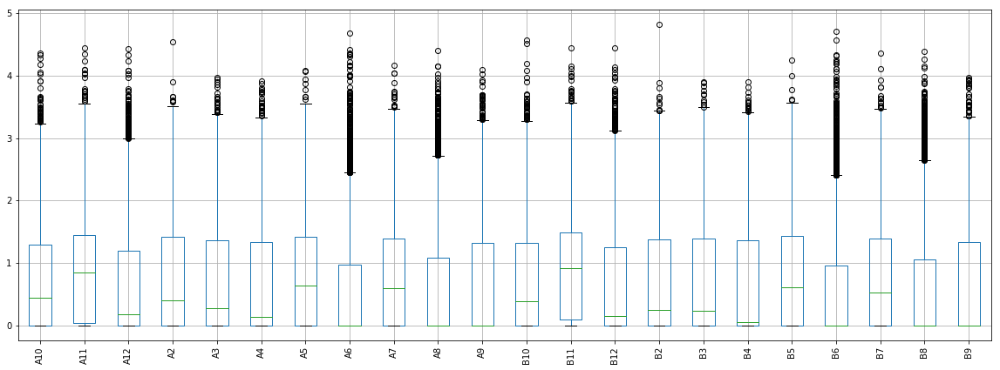

In [36]:
# Box plots to visualize outliers for log data
# a lot more outliers
plt.figure(figsize=(20,7))
plt.subplots
driver_map_data_all_log10_df.boxplot()
plt.xticks(rotation=90)